Project one test reads
---

In [4]:
# Dependencies and Setup
import string
import pandas as pd
import geopandas as gpd
import fiona 
import matplotlib as plt
from pathlib import Path

from urllib.request import urlopen
import json

import plotly.express as px

# File to Load (Remember to Change These)
food_data_to_load = Path("DataDownload.xls")

counties_to_load = Path("UScounties.shp")

dict_df = pd.read_excel(food_data_to_load,
                         sheet_name=["Read_Me",
                                     "Variable List", 
                                     "Supplemental Data - County",
                                    "Supplemental Data - State",
                                    "ACCESS",
                                     "STORES",
                                     "RESTAURANTS",
                                     "ASSISTANCE",
                                     "INSECURITY",
                                     "PRICES_TAXES",
                                     "LOCAL",
                                     "HEALTH",
                                     "SOCIOECONOMIC"
                                    ])

stores_df = dict_df.get("STORES")
access_df = dict_df.get("ACCESS")
restaurants_df = dict_df.get("RESTAURANTS")
insecurity_df = dict_df.get("INSECURITY")
prices_taxes_df = dict_df.get("PRICES_TAXES")
local_df = dict_df.get("LOCAL")
health_df = dict_df.get("HEALTH")
socioeconomic_df = dict_df.get("SOCIOECONOMIC")

supp_states_df = dict_df.get("Supplemental Data - State")
supp_county_df = dict_df.get("Supplemental Data - County")
variables_df = dict_df.get("Variable List")

# Display the data tables for preview

restaurants_df.head()


,FIPS,State,County,FFR09,FFR14,PCH_FFR_09_14,FFRPTH09,FFRPTH14,PCH_FFRPTH_09_14,FSR09,FSR14,PCH_FSR_09_14,FSRPTH09,FSRPTH14,PCH_FSRPTH_09_14,PC_FFRSALES07,PC_FFRSALES12,PC_FSRSALES07,PC_FSRSALES12
0,1001,AL,Autauga,30,36,20.000000,0.554170,0.649878,17.270512,34,29,-14.705882,0.628059,0.523513,-16.645960,649.511367,674.80272,484.381507,512.280987
1,1003,AL,Baldwin,112,132,17.857143,0.624282,0.659634,5.662750,202,221,9.405941,1.125938,1.104387,-1.914027,649.511367,674.80272,484.381507,512.280987
2,1005,AL,Barbour,21,22,4.761905,0.759301,0.818239,7.762116,12,15,25.000000,0.433887,0.557890,28.579797,649.511367,674.80272,484.381507,512.280987
3,1007,AL,Bibb,7,5,-28.571429,0.305131,0.222163,-27.190844,6,5,-16.666667,0.261540,0.222163,-15.055985,649.511367,674.80272,484.381507,512.280987
4,1009,AL,Blount,24,21,-12.500000,0.418549,0.363832,-13.073035,19,15,-21.052632,0.331351,0.259880,-21.569656,649.511367,674.80272,484.381507,512.280987


In [73]:
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

# counties
    

In [6]:
counties_df = gpd.read_file(counties_to_load)
counties_df.head()

,NAME,STATE_NAME,STATE_FIPS,CNTY_FIPS,FIPS,geometry
0,Lake of the Woods,Minnesota,27,077,27077,"POLYGON ((-95.34283 48.54668, -95.34105 48.715..."
1,Ferry,Washington,53,019,53019,"POLYGON ((-118.85163 47.94956, -118.84846 48.4..."
2,Stevens,Washington,53,065,53065,"POLYGON ((-117.43883 48.04412, -117.54219 48.0..."
3,Okanogan,Washington,53,047,53047,"POLYGON ((-118.97209 47.93915, -118.97406 47.9..."
4,Pend Oreille,Washington,53,051,53051,"POLYGON ((-117.43858 48.99992, -117.03205 48.9..."


In [74]:
#counties_df.plot()

In [75]:
# access_df.plot()

In [76]:

access_df.head()

,FIPS,State,County,LACCESS_POP10,LACCESS_POP15,PCH_LACCESS_POP_10_15,PCT_LACCESS_POP10,PCT_LACCESS_POP15,LACCESS_LOWI10,LACCESS_LOWI15,...,LACCESS_HISP15,PCT_LACCESS_HISP15,LACCESS_NHASIAN15,PCT_LACCESS_NHASIAN15,LACCESS_NHNA15,PCT_LACCESS_NHNA15,LACCESS_NHPI15,PCT_LACCESS_NHPI15,LACCESS_MULTIR15,PCT_LACCESS_MULTIR15
0,1001,AL,Autauga,18428.439685,17496.693038,-5.056026,33.769657,32.062255,5344.427472,6543.676824,...,471.136164,0.863345,86.767975,0.159000,61.169869,0.112092,8.817961,0.016159,482.848633,0.884808
1,1003,AL,Baldwin,35210.814078,30561.264430,-13.204891,19.318473,16.767489,9952.144027,9886.831137,...,1377.874834,0.755973,212.946378,0.116833,181.649648,0.099662,14.819634,0.008131,1127.696098,0.618712
2,1005,AL,Barbour,5722.305602,6069.523628,6.067799,20.840972,22.105560,3135.676086,2948.790251,...,509.377525,1.855183,17.096410,0.062266,39.960527,0.145539,8.082376,0.029436,462.382655,1.684025
3,1007,AL,Bibb,1044.867327,969.378841,-7.224696,4.559753,4.230324,491.449066,596.162829,...,8.596762,0.037516,1.994318,0.008703,2.513097,0.010967,0.000000,0.000000,5.259244,0.022951
4,1009,AL,Blount,1548.175559,3724.428242,140.568857,2.700840,6.497380,609.027708,1650.959482,...,497.489891,0.867886,8.428994,0.014705,28.938242,0.050484,1.062851,0.001854,202.914187,0.353990


In [78]:
# Explode the array column in the Pandas DataFrame for merging with the geoDataFrame
exploded_df = access_df.explode('FIPS')

# Print the merged DataFrame
#print(exploded_df)


In [79]:
results = exploded_df.dtypes

print(results)

FIPS                           int64
State                         object
County                        object
LACCESS_POP10                float64
LACCESS_POP15                float64
PCH_LACCESS_POP_10_15        float64
PCT_LACCESS_POP10            float64
PCT_LACCESS_POP15            float64
LACCESS_LOWI10               float64
LACCESS_LOWI15               float64
PCH_LACCESS_LOWI_10_15       float64
PCT_LACCESS_LOWI10           float64
PCT_LACCESS_LOWI15           float64
LACCESS_HHNV10               float64
LACCESS_HHNV15               float64
PCH_LACCESS_HHNV_10_15       float64
PCT_LACCESS_HHNV10           float64
PCT_LACCESS_HHNV15           float64
LACCESS_SNAP15               float64
PCT_LACCESS_SNAP15           float64
LACCESS_CHILD10              float64
LACCESS_CHILD15              float64
LACCESS_CHILD_10_15          float64
PCT_LACCESS_CHILD10          float64
PCT_LACCESS_CHILD15          float64
LACCESS_SENIORS10            float64
LACCESS_SENIORS15            float64
P

In [80]:
results2 = counties_df.dtypes
print(results2)

NAME            object
STATE_NAME      object
STATE_FIPS      object
CNTY_FIPS       object
FIPS             int32
geometry      geometry
dtype: object


In [81]:
counties_exploded_df = counties_df.explode('FIPS')

In [84]:
# Convert the shared column in the GeoDataFrame to int 

counties_merge_df = counties_df

counties_merge_df['FIPS'] = counties_merge_df['FIPS'].astype(int)


In [85]:
# Perform the merge based on the exploded FIPS column and the converted column in the GeoPandas DataFrame
merged_final_df = counties_merge_df.merge(exploded_df, left_on='FIPS', right_on='FIPS')

# Print the merged DataFrame
print(merged_final_df)


                     NAME  STATE_NAME STATE_FIPS CNTY_FIPS   FIPS  \
0       Lake of the Woods   Minnesota         27       077  27077   
1                   Ferry  Washington         53       019  53019   
2                 Stevens  Washington         53       065  53065   
3                Okanogan  Washington         53       047  53047   
4            Pend Oreille  Washington         53       051  53051   
...                   ...         ...        ...       ...    ...   
3133              Yakutat      Alaska         02       282   2282   
3134        Yukon-Koyukuk      Alaska         02       290   2290   
3135  Southeast Fairbanks      Alaska         02       240   2240   
3136               Denali      Alaska         02       068   2068   
3137           Broomfield    Colorado         08       014   8014   

                                               geometry State  \
0     POLYGON ((-95.34283 48.54668, -95.34105 48.715...    MN   
1     POLYGON ((-118.85163 47.94956, -118

C:\Users\User18\anaconda3\lib\site-packages\geopandas\plotting.py:48: ShapelyDeprecationWarning:

The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.



(-183.78001472868402,
 -61.406854669684265,
 16.297563893978637,
 74.03045781836326)

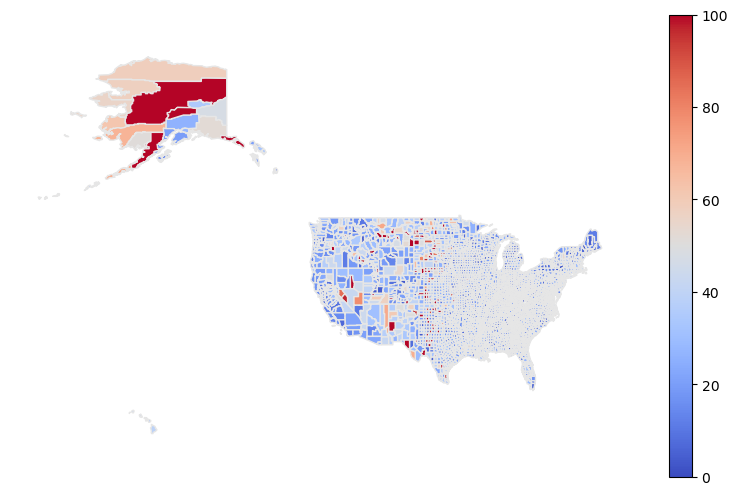

In [87]:
fig, ax = plt.pyplot.subplots(1, figsize=(10,6))

merged_final_df.plot(column='PCT_LACCESS_POP15', cmap='coolwarm', linewidth=1, ax=ax, edgecolor='0.9', legend = True)
ax.axis('off')

In [88]:
import plotly.graph_objects as go

# Create a choropleth map of the US
fig = go.Figure(data=go.Choropleth(
    locations=['state1', 'state2', 'state3'],  # Specify the relevant US state codes or names
    z=[value1, value2, value3],  # Specify the corresponding values for each state
    locationmode='USA-states',
    colorscale='YlOrRd',
    colorbar_title='Value'
))

# Set the map layout
fig.update_geos(
    resolution=110,  # Set the resolution of the map
    showcoastlines=False,  # Hide the coastlines
    showcountries=False,  # Hide the country boundaries
    showland=False,  # Hide the land color
    showocean=False,  # Hide the ocean color
    showlakes=False,  # Hide the lakes color
    showrivers=False  # Hide the rivers color
)

# Show the choropleth map
fig.show()


NameError: name 'value1' is not defined

In [137]:
fig = px.choropleth(merged_final_df, geojson=merged_final_df.geometry, 
                    locations=merged_final_df.index, color="PCT_LACCESS_POP15",
                    height=500,  
                    #width = 500,
                    projection='mercator',
                    color_continuous_scale = px.colors.diverging.BrBG)
#color_continuous_midpoint = "PCT_LACCESS_POP15".value)

In [143]:

fig.update_geos(fitbounds="locations", visible=True)
fig.update_layout(title_text='Percent Limited Access 2015')
fig.update(layout = dict(title=dict(x=0.5)))

fig.update_layout(margin={"r":0,"t":30,"l":0,"b":10}, coloraxis_colorbar={'title':'PCT_LACCESS_POP15'})

fig.update_geos(resolution=50,
                showcoastlines=False,
                showland = False)

fig.update_layout(geo=dict(center=dict(lat=39, lon=-98)),
                  margin=dict(l=0, r=0, t=30, b=10))


#fig.update_geos(fitbounds='locations', resolution=50)
#
#fig.update_geos(
 #   resolution=110,  # Set the resolution of the map
#    showcoastlines=False,  # Hide the coastlines
 #   showcountries=False,  # Hide the country boundaries
  #  showland=False,  # Hide the land color
  #  showocean=False,  # Hide the ocean color
   # showlakes=False,  # Hide the lakes color
   # showrivers=False  # Hide the rivers color
#)
    
fig.show()

In [ ]:
fig = px.choropleth(merged_final_df, geojson=merged_final_df.geometry, 
                    locations=merged_final_df.index, color="PCT_LACCESS_POP15",
                    height=500,  
                    #width = 500,
                    projection='mercator',
                    color_continuous_scale = px.colors.diverging.BrBG
                    #color_continuous_scale = px.colors.diverging.BrBG
                    #color_continuous_midpoint = "PCT_LACCESS_POP15"
)

                    #color_continuous_scale="Viridis")
                    #color_continuous_scale="bluered")
        

In [ ]:
fig, ax = plt.subplots(1, figsize=(10,6))
df_merged.plot(column='Sum', cmap='Blues', linewidth=1, ax=ax, edgecolor='0.9', legend = True)
ax.axis('off')

In [ ]:
stores_df.head()

In [ ]:
variable_list = variables_df.columns

variable_list

In [ ]:
access_vars = variables_df[(variables_df["Category Code"] == "ACCESS")]
access_vars

access_name_list = access_vars["Variable Name"]
access_var_codes = access_vars["Variable Code"]

access_dict = zip(access_var_codes, access_name_list)

access_dict

In [ ]:
variables_df.head(25)

In [ ]:
local_df.head()

In [ ]:
insecurity_df.head()

In [ ]:
access_df.head()

In [ ]:
restaurants_df.head()

In [ ]:
insecurity_df.head()

In [ ]:
prices_taxes_df.head()

In [ ]:
health_df.head()

In [ ]:
socioeconomic_df.head()

In [ ]:
supp_states_df.head()

In [ ]:
supp_county_df.head()

In [ ]:


fig = px.choropleth(access_df, geojson=counties, locations='FIPS', color='PCH_LACCESS_POP_10_15',
                           color_continuous_scale="Viridis",
                           range_color=(0, 12),
                           scope="usa",
                           labels={'Low Food Access % 2015'}
                          )
## fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()



In [ ]:
counties